In [2]:
import vectorbtpro as vbt
import numpy as np
import pandas as pd

/Users/ericervin/opt/anaconda3/envs/datascience/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)


In [3]:
dollarbars = vbt.BinanceData.load('data/btc_90M_db_vbt.pkl')
dollarbars.get() 

,Open,High,Low,Close,Volume,Quote volume,Trade count,Taker base volume,Taker quote volume,Open Time,Close Time
Open Time,,,,,,,,,,,
2021-01-01 00:00:00+00:00,28948.19,29045.93,28706.00,28796.30,3181.960,9.183460e+07,24166,1277.389,3.689901e+07,2021-01-01 00:00:00+00:00,2021-01-01 00:14:59.999000+00:00
2021-01-01 00:15:00+00:00,28786.92,28968.49,28752.30,28947.61,3338.349,9.634788e+07,28697,1808.997,5.221244e+07,2021-01-01 00:15:00+00:00,2021-01-01 00:43:59.999000+00:00
2021-01-01 00:44:00+00:00,28934.15,29122.08,28910.94,29164.03,2569.563,7.457184e+07,23009,1502.982,4.362363e+07,2021-01-01 00:44:00+00:00,2021-01-01 01:07:59.999000+00:00
2021-01-01 01:08:00+00:00,29088.42,29294.00,29087.51,29290.02,3368.618,9.838166e+07,18390,2106.629,6.153788e+07,2021-01-01 01:08:00+00:00,2021-01-01 01:12:59.999000+00:00
2021-01-01 01:13:00+00:00,29284.95,29499.00,29242.98,29419.75,3055.165,8.979413e+07,17538,1907.273,5.607186e+07,2021-01-01 01:13:00+00:00,2021-01-01 01:14:59.999000+00:00
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-03 21:12:00+00:00,27004.00,27023.80,26900.00,26987.20,7490.436,2.018964e+08,45123,3398.220,9.161108e+07,2023-06-03 21:12:00+00:00,2023-06-03 21:15:59.999000+00:00
2023-06-03 21:16:00+00:00,26978.00,27017.90,26975.30,26985.00,3540.511,9.558571e+07,29345,1990.916,5.375043e+07,2023-06-03 21:16:00+00:00,2023-06-03 21:31:59.999000+00:00
2023-06-03 21:32:00+00:00,26988.90,26989.00,26927.90,26969.90,3397.719,9.157614e+07,30120,1586.744,4.276554e+07,2023-06-03 21:32:00+00:00,2023-06-03 21:50:59.999000+00:00


In [4]:
pivotinfo = pivot_info = dollarbars.run("pivotinfo", up_th=.20, down_th=0.20)

In [9]:
pivotinfo.conf_value


Open Time
2021-01-01 00:00:00+00:00        NaN
2021-01-01 00:15:00+00:00        NaN
2021-01-01 00:44:00+00:00        NaN
2021-01-01 01:08:00+00:00        NaN
2021-01-01 01:13:00+00:00        NaN
                              ...   
2023-06-03 21:12:00+00:00    19521.6
2023-06-03 21:16:00+00:00    19521.6
2023-06-03 21:32:00+00:00    19521.6
2023-06-03 21:51:00+00:00    19521.6
2023-06-03 22:22:00+00:00    19521.6
Name: (0.2, 0.2), Length: 124942, dtype: float64

In [12]:
pivotinfo.pivots_readable

Open Time
2021-01-01 00:00:00+00:00    Valley
2021-01-01 00:15:00+00:00      None
2021-01-01 00:44:00+00:00      None
2021-01-01 01:08:00+00:00      None
2021-01-01 01:13:00+00:00      None
                              ...  
2023-06-03 21:12:00+00:00      None
2023-06-03 21:16:00+00:00      None
2023-06-03 21:32:00+00:00      None
2023-06-03 21:51:00+00:00      None
2023-06-03 22:22:00+00:00      Peak
Name: (0.2, 0.2), Length: 124942, dtype: object

In [38]:
# conf_pivot: the type of the latest confirmed pivot (running)
# conf_idx: the index of the latest confirmed pivot (running)
# conf_value: the high/low value under the latest confirmed pivot (running)
# last_pivot: the type of the latest pivot (running)
# last_idx: the index of the latest pivot (running)
# last_value: the high/low value under the latest pivot (running)
# pivots: confirmed pivots stored under their indices (looking ahead - use only for plotting!)
# modes: modes between confirmed pivot points (looking ahead - use only for plotting!)


pivot_df = pd.DataFrame()
pivot_df['close'] = dollarbars.close
pivot_df['conf_pivot'] = pivotinfo.conf_pivot
pivot_df['conf_idx'] = pivotinfo.conf_idx
pivot_df['conf_value'] = pivotinfo.conf_value
pivot_df['last_pivot'] = pivotinfo.last_pivot
pivot_df['last_value'] = pivotinfo.last_value
pivot_df['last_idx'] = pivotinfo.last_idx
pivot_df['pivots'] = pivotinfo.pivots
pivot_df['modes'] = pivotinfo.modes



In [39]:
pivot_df.loc['2021-01'].iloc[250:300]


,close,conf_pivot,conf_idx,conf_value,last_pivot,last_value,last_idx,pivots,modes
Open Time,,,,,,,,,
2021-01-03 05:11:00+00:00,33883.48,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:14:00+00:00,33946.60,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:19:00+00:00,34002.21,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:26:00+00:00,34185.64,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:31:00+00:00,34100.01,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:38:00+00:00,33938.82,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:43:00+00:00,33936.36,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:54:00+00:00,33823.58,0,-1,NaN,0,NaN,-1,0,1
2021-01-03 05:59:00+00:00,34112.23,0,-1,NaN,0,NaN,-1,0,1


In [40]:
pivot_df.head(10)

,close,conf_pivot,conf_idx,conf_value,last_pivot,last_value,last_idx,pivots,modes
Open Time,,,,,,,,,
2021-01-01 00:00:00+00:00,28796.30,0,-1,NaN,0,NaN,-1,-1,1
2021-01-01 00:15:00+00:00,28947.61,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 00:44:00+00:00,29164.03,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:08:00+00:00,29290.02,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:13:00+00:00,29419.75,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:15:00+00:00,29336.01,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:23:00+00:00,29435.49,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:32:00+00:00,29366.88,0,-1,NaN,0,NaN,-1,0,1
2021-01-01 01:44:00+00:00,29383.28,0,-1,NaN,0,NaN,-1,0,1


In [41]:
fig = dollarbars.loc['2021'].plot()
pivot_info.loc['2021'].plot(fig=fig).show()

<Axes: xlabel='Open Time'>

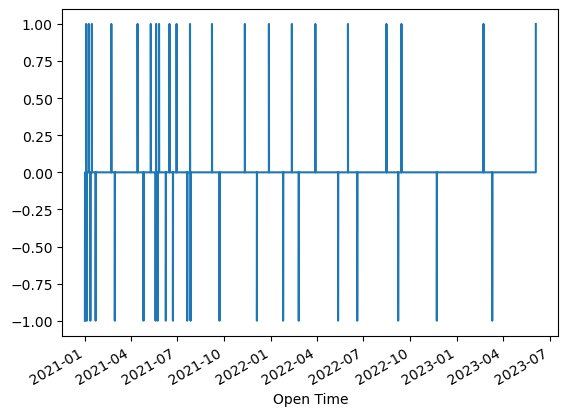

In [23]:
pivot_info